[{'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance', 'dur_walking'], 'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1], 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16]], 'betas': ['B_age_Walk', 'B_female_Walk', 'B_day_of_week_Walk', 'B_start_time_linear_Walk', 'B_car_ownership_Walk', 'B_driving_license_Walk', 'B_purpose_B_Walk', 'B_purpose_HBE_Walk', 'B_purpose_HBO_Walk', 'B_purpose_HBW_Walk', 'B_purpose_NHBO_Walk', 'B_fueltype_Avrg_Walk', 'B_fueltype_Diesel_Walk', 'B_fueltype_Hybrid_Walk', 'B_fueltype_Petrol_Walk', 'B_distance_Walk', 'B_dur_walking_Walk'], 'categorical_feature': []}, {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_lice

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost\rumboost\rumboost.py:907: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1] -- NCE value on train set: 1.290369405504184 
     --  NCE value on test set: 1.291368521454541
[11] -- NCE value on train set: 0.9043151551025388 
     --  NCE value on test set: 0.9136528321558512
[21] -- NCE value on train set: 0.7998681918782754 
     --  NCE value on test set: 0.8144240987389426
[31] -- NCE value on train set: 0.7573811428720544 
     --  NCE value on test set: 0.7746307476360205
[41] -- NCE value on train set: 0.7350948848323061 
     --  NCE value on test set: 0.7541759961316323
[51] -- NCE value on train set: 0.7209382221612519 
     --  NCE value on test set: 0.7411061684665313
[61] -- NCE value on train set: 0.7109182348090581 
     --  NCE value on test set: 0.7320403104603515
[71] -- NCE value on train set: 0.7032900136887579 
     --  NCE value on test set: 0.7249735381973462
[81] -- NCE value on train set: 0.6972749442803938 
     --  NCE value on test set: 0.7195488604394915
[91] -- NCE value on train set: 0.6923852181353343 
     --  NCE value on te

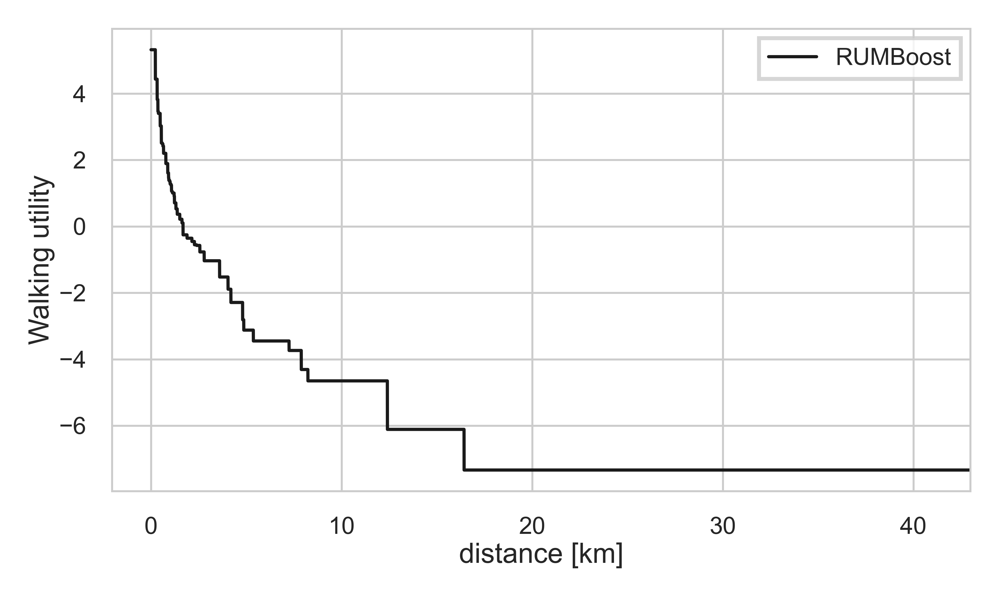

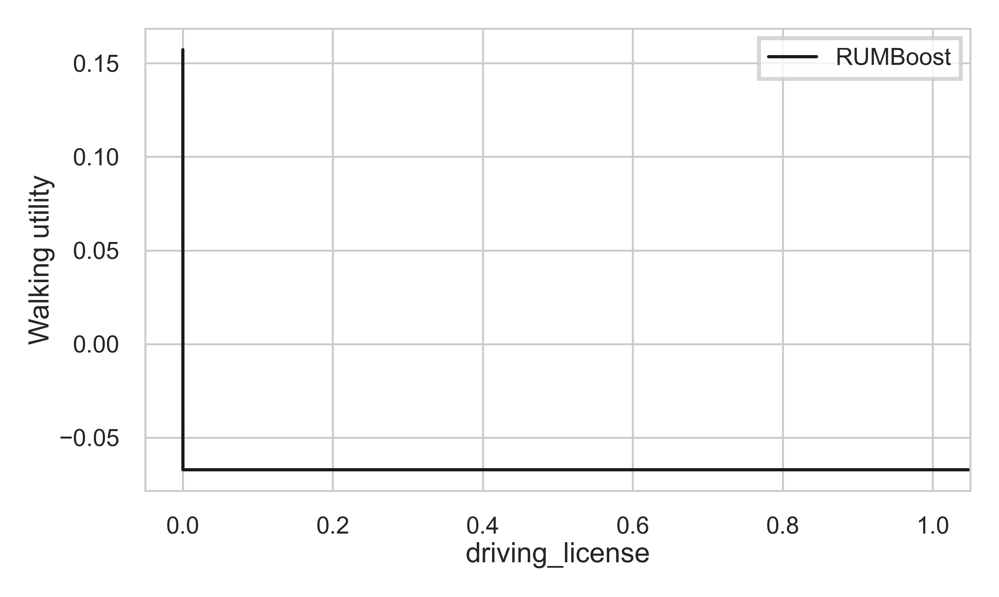

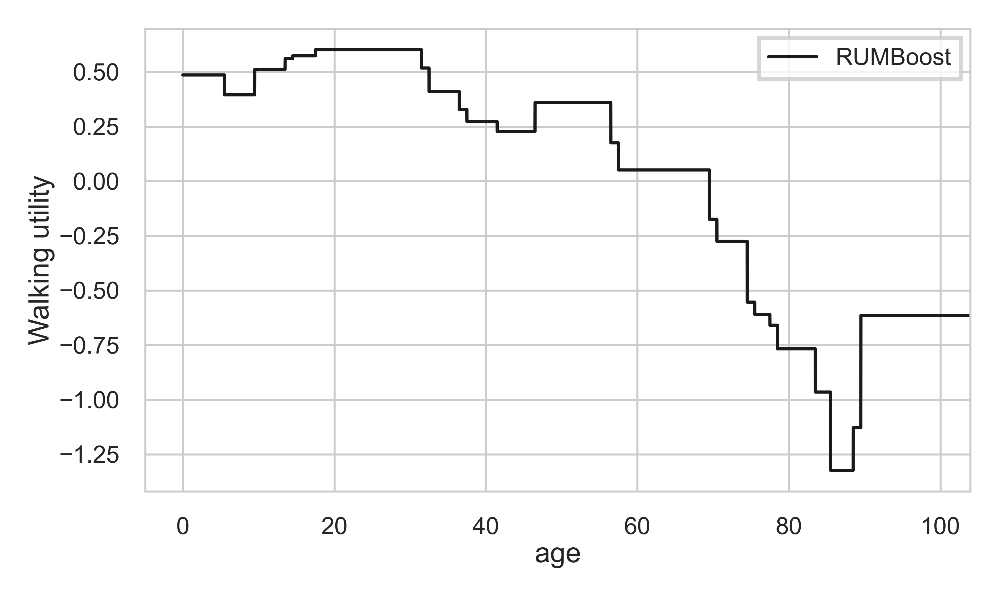

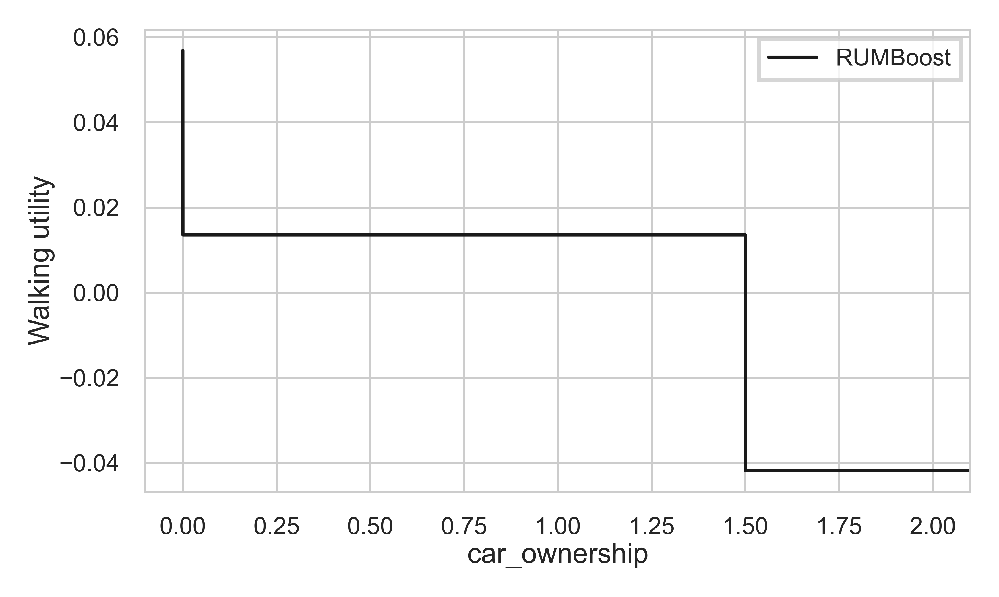

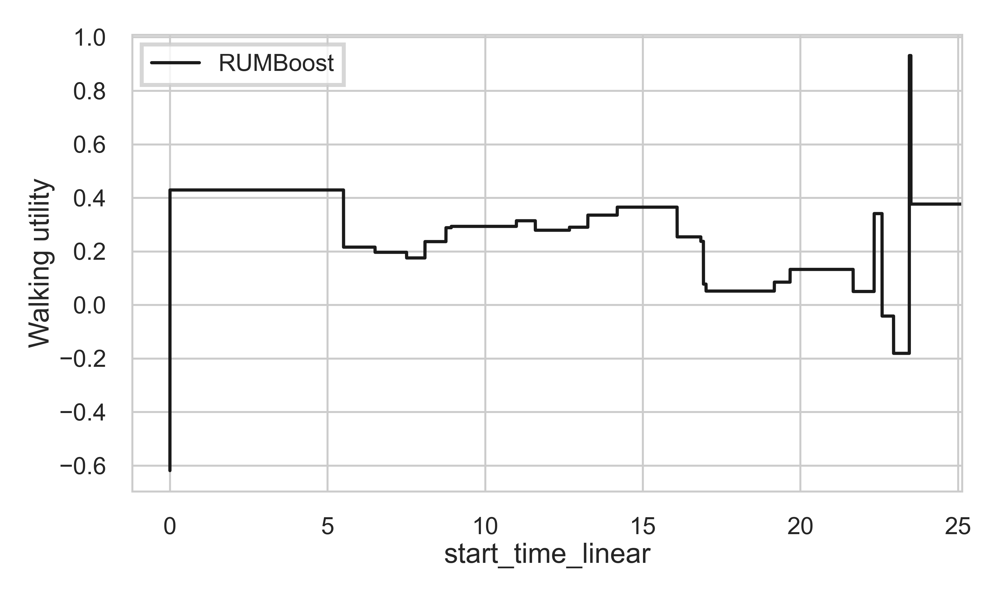

...

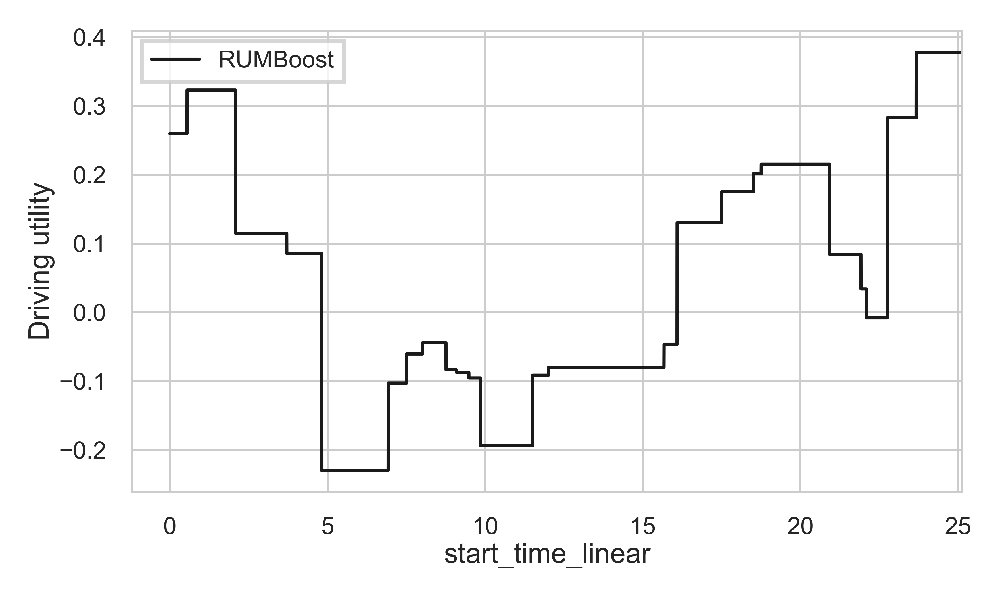

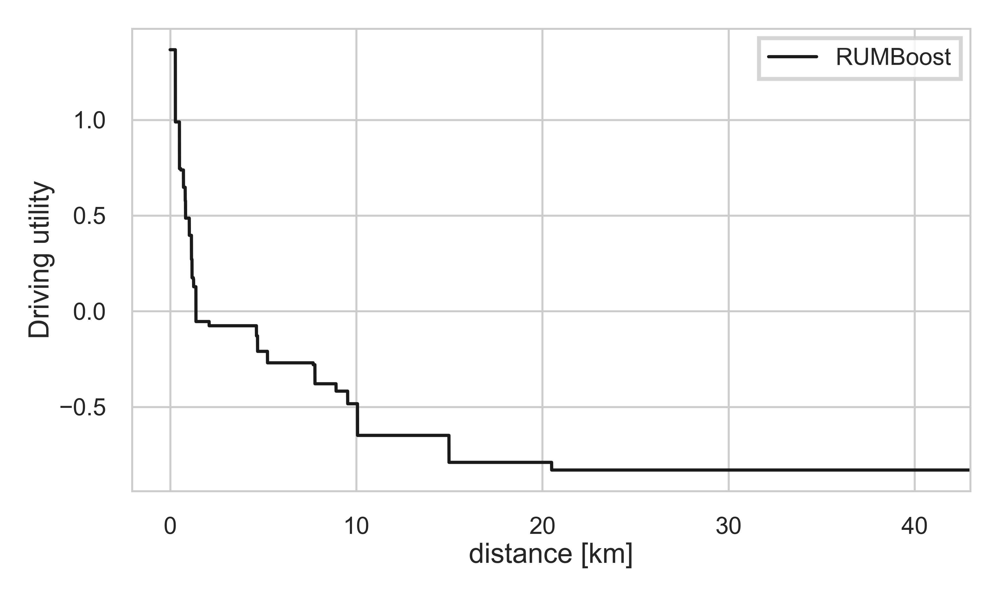

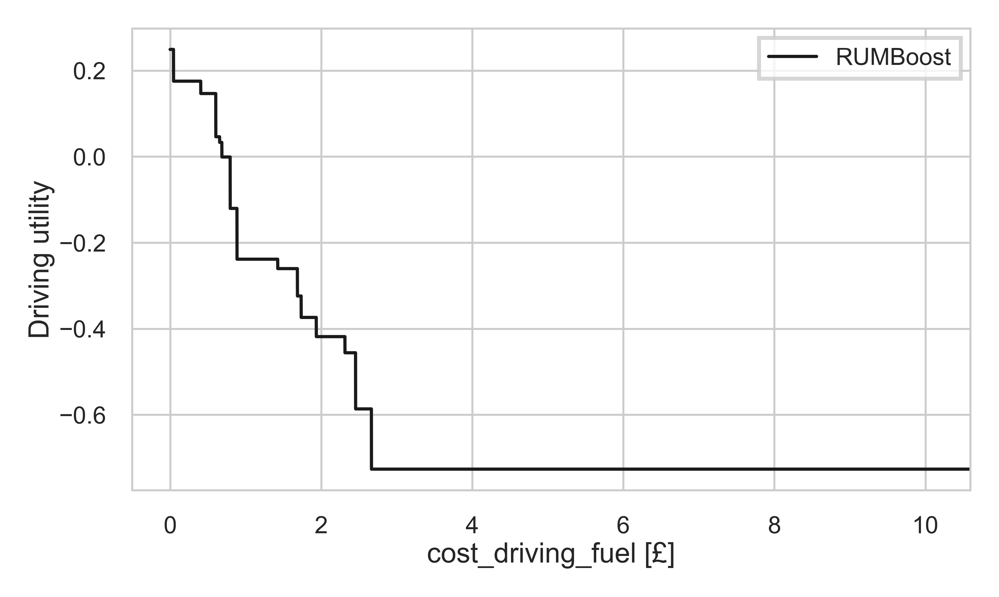

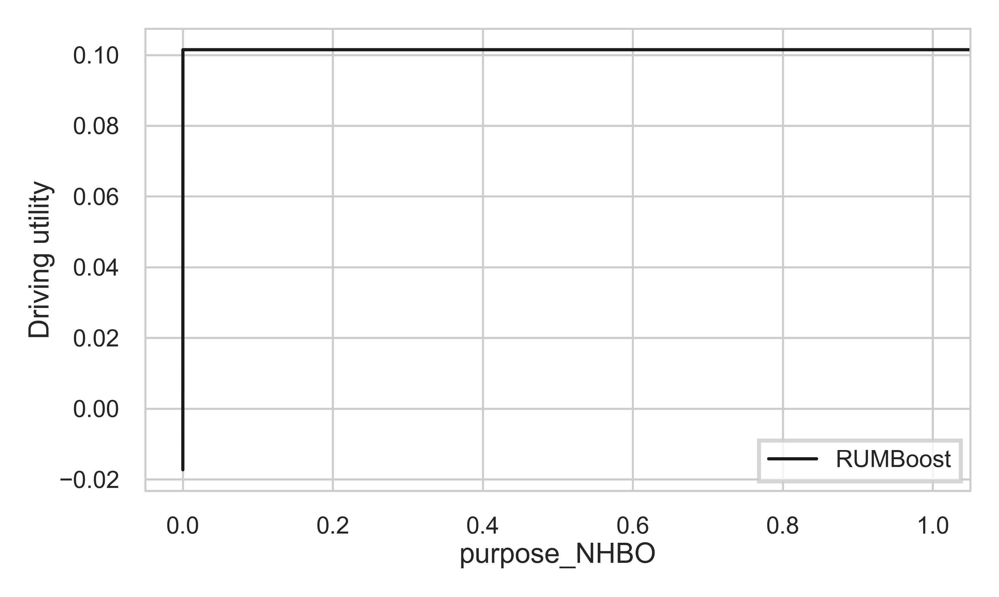

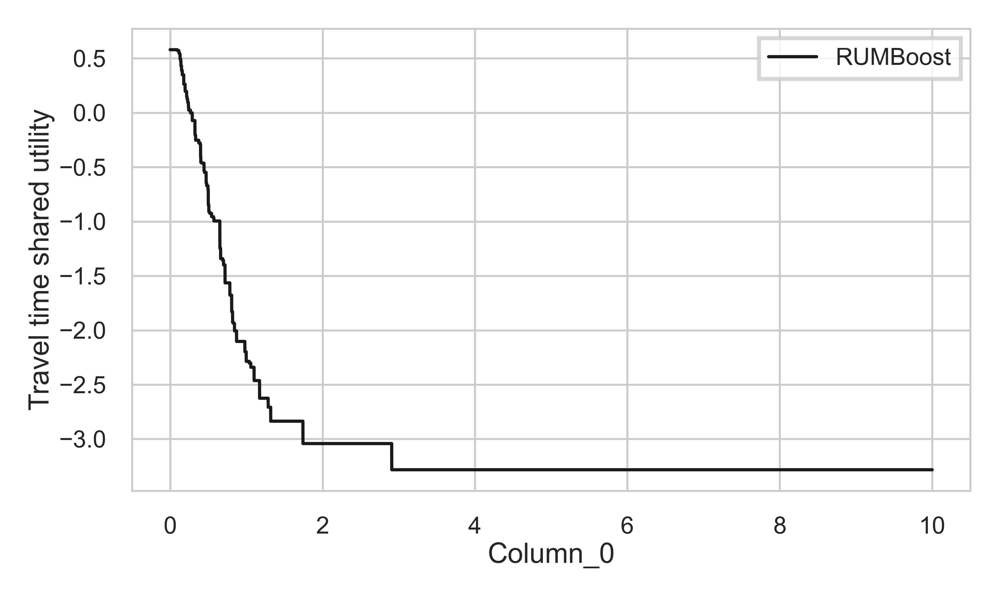

In [1]:
import sys
sys.path.append('../')

from rumboost.utils import *
from rumboost.utility_smoothing import *
from rumboost.rumboost import *
from rumboost.dataset import *
from rumboost.models import *
from rumboost.utility_plotting import *
from rumboost.post_process import *

import lightgbm as lgb

#load dataset
LPMC_train, LPMC_test, folds = load_preprocess_LPMC()

#load model
LPMC_model = LPMC(LPMC_train)

#parameters
params = {'n_jobs': -1,
          'num_classes':4, #important
          'objective':'multiclass',
          'boosting': 'gbdt',
          'monotone_constraints_method': 'advanced',
          'verbosity': 1,
          'num_iterations':1500,
          #'early_stopping_round':100,
          'learning_rate':0.1,
          'max_depth':1 #important to let it at 1 so that the model can split on many different features.
          }

rum_structure = [{'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance'], 
                  'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1], 
                  'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15]], 
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance'], 
                 'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1], 
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15]]
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance', 'dur_pt_access', 'dur_pt_bus', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'pt_n_interchanges', 'cost_transit'], 
                 'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1, -1, -1, -1, -1, -1],
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20], [21]],
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance', 'cost_driving_fuel', 'congestion_charge', 'driving_traffic_percent'], 
                 'monotone_constraints': [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1, -1, -1], 
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18]],
                },
                {'columns': ['dur_walking', 'dur_cycling', 'dur_pt_rail', 'dur_driving'],
                 'monotone_constraints': [-1],
                },
                # {'columns': ['dur_walking', 'dur_cycling'],
                #  'monotone_constraints': [-1]
                # },
                # {'columns': ['dur_pt_rail', 'dur_driving'],
                #  'monotone_constraints': [-1]
                # },
                ]

shared_ensembles = {4: [0, 1, 2, 3]}
#shared_ensembles = {4: [0, 1],
#                    5: [2, 3]}

#features and label column names
features = [f for f in LPMC_train.columns if f != "choice"]
label = "choice"

#create lightgbm dataset
lgb_train_set = lgb.Dataset(LPMC_train[features], label=LPMC_train[label], free_raw_data=False)
lgb_test_set = lgb.Dataset(LPMC_test[features], label=LPMC_test[label], free_raw_data=False)

LPMC_model_fully_trained = rum_train(params, lgb_train_set, rum_structure, valid_sets=[lgb_test_set], shared_ensembles=shared_ensembles)

utility_names = {'0':'Walking', '1':'Cycling', '2':'Public Transport', '3': 'Driving', '4':'Travel time shared'}

plot_parameters(LPMC_model_fully_trained, LPMC_train, utility_names,only_1d=True)



c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost\rumboost\rumboost.py:907: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1] -- NCE value on train set: 1.2800424271069377 
     --  NCE value on test set: 1.2816628445582654
[11] -- NCE value on train set: 0.8971735403538162 
     --  NCE value on test set: 0.9083433013825711
[21] -- NCE value on train set: 0.7991565573659467 
     --  NCE value on test set: 0.8143223821196346
[31] -- NCE value on train set: 0.7573650528379142 
     --  NCE value on test set: 0.7751731457804582
[41] -- NCE value on train set: 0.7346512334409385 
     --  NCE value on test set: 0.7541188006851005
[51] -- NCE value on train set: 0.7199758198662977 
     --  NCE value on test set: 0.7404461906889144
[61] -- NCE value on train set: 0.7095665701870102 
     --  NCE value on test set: 0.7311044317924617
[71] -- NCE value on train set: 0.7016332781925579 
     --  NCE value on test set: 0.7239553813581969
[81] -- NCE value on train set: 0.6954668894675646 
     --  NCE value on test set: 0.7184018793063107
[91] -- NCE value on train set: 0.6904670519998682 
     --  NCE value on 

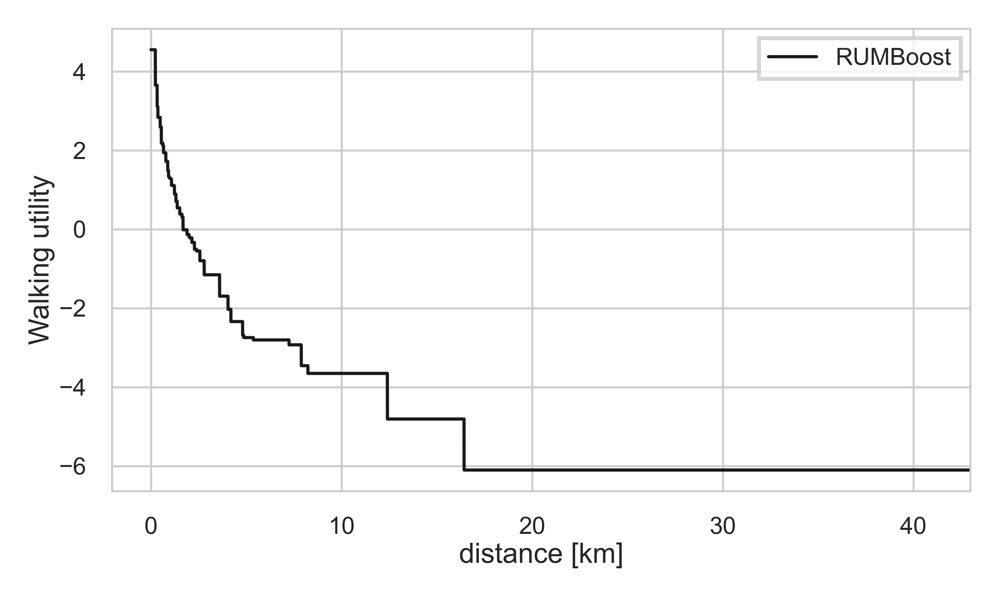

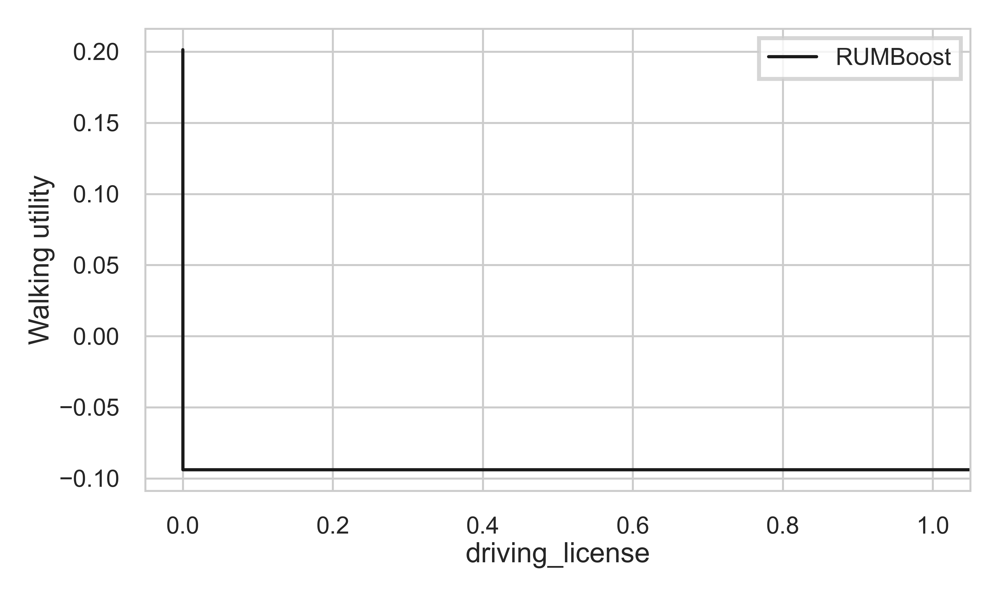

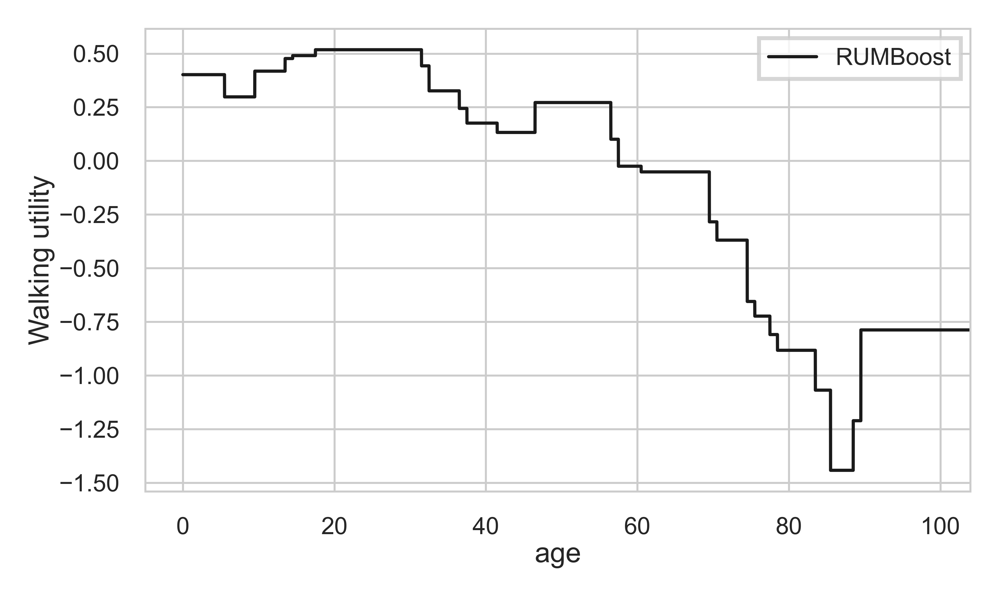

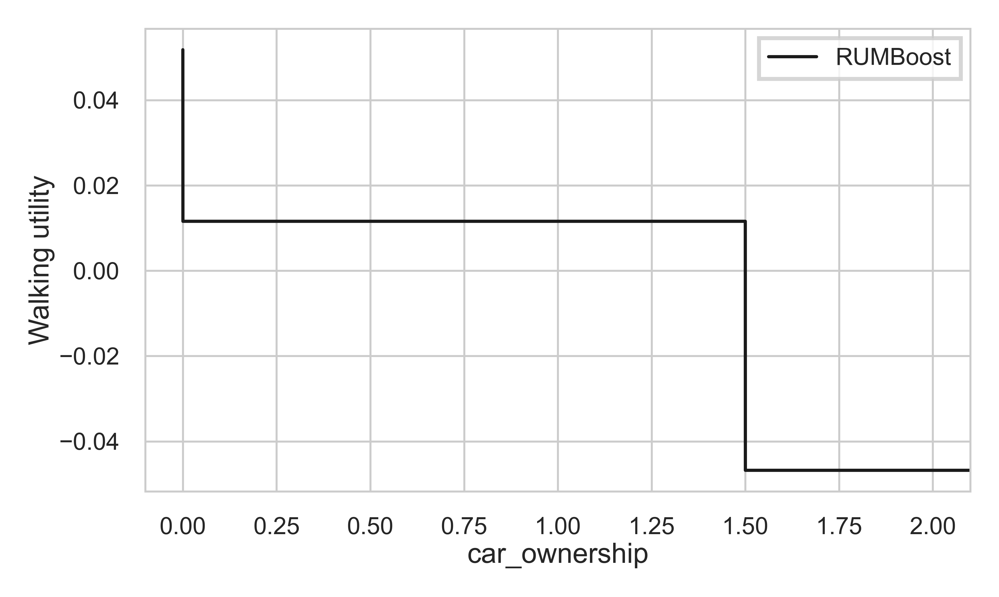

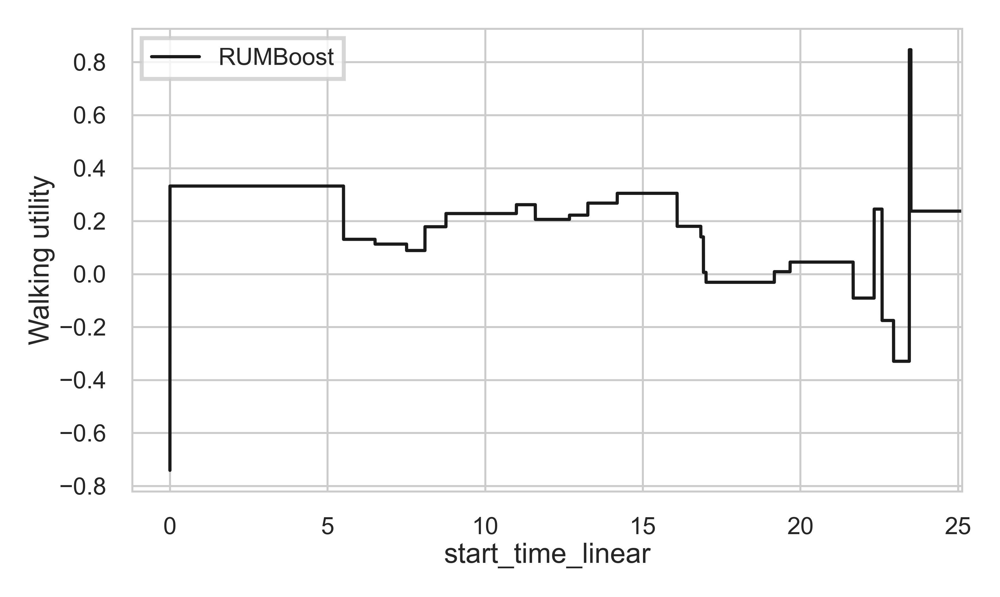

...

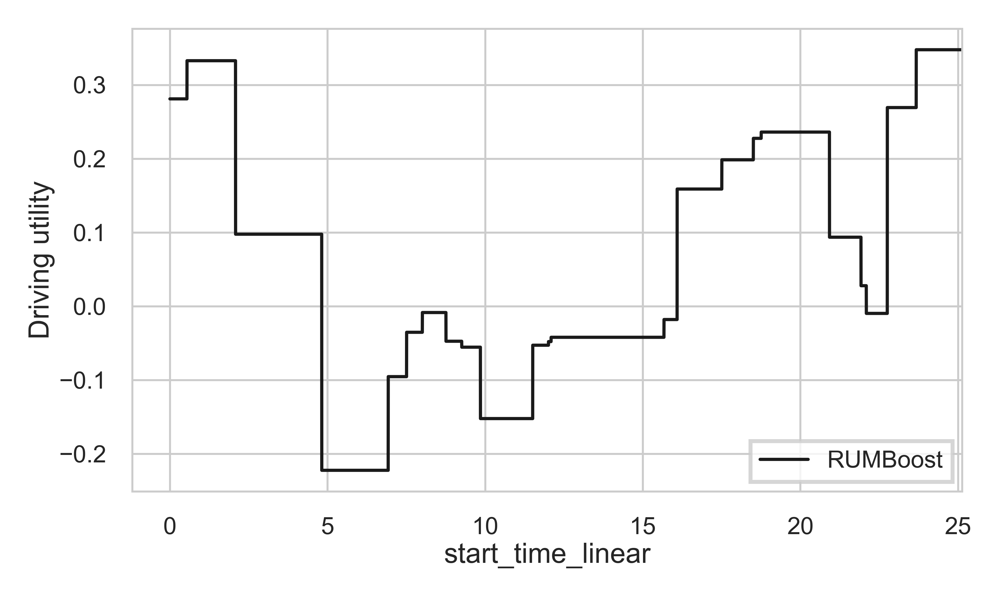

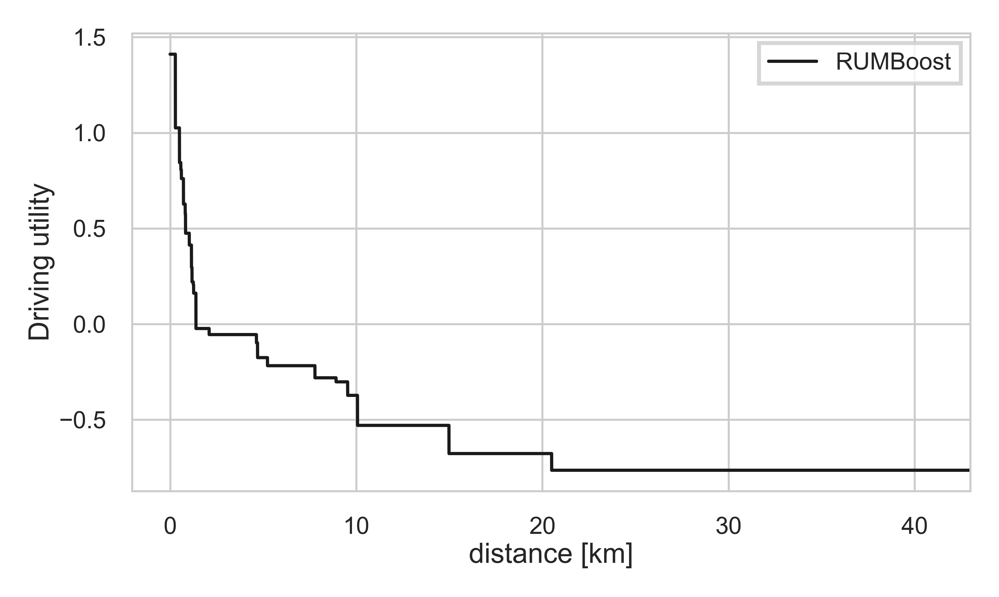

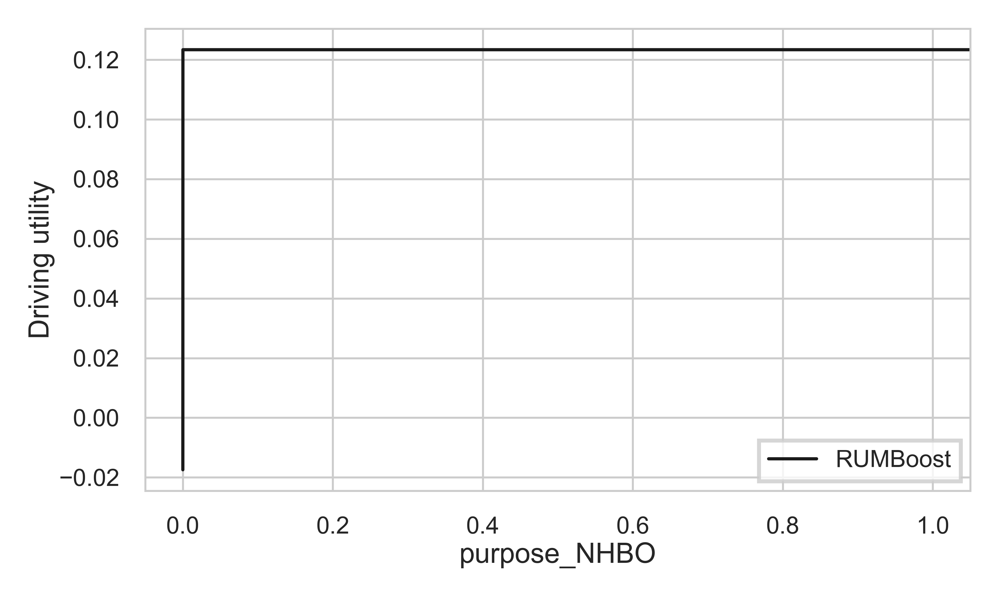

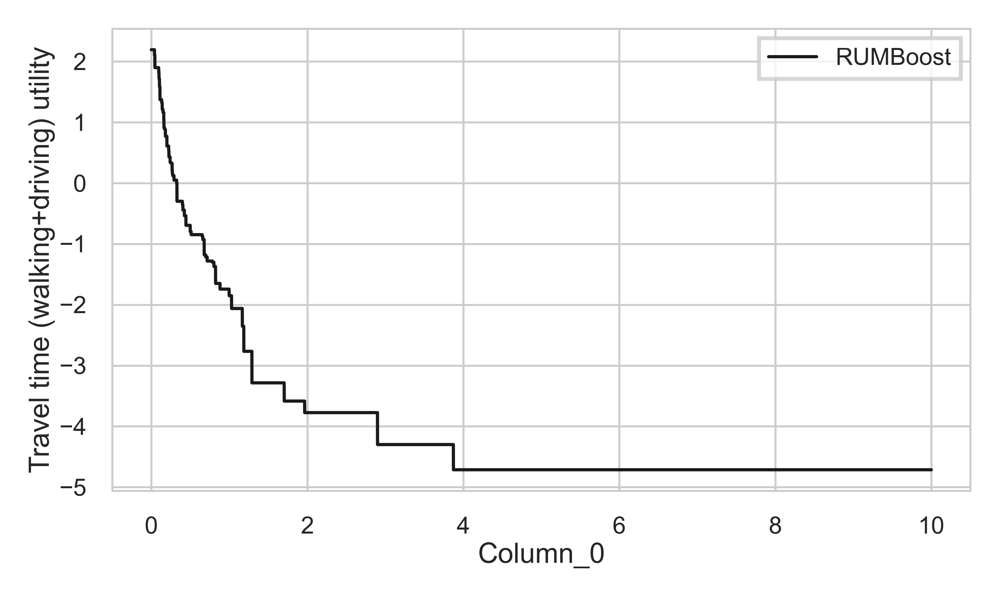

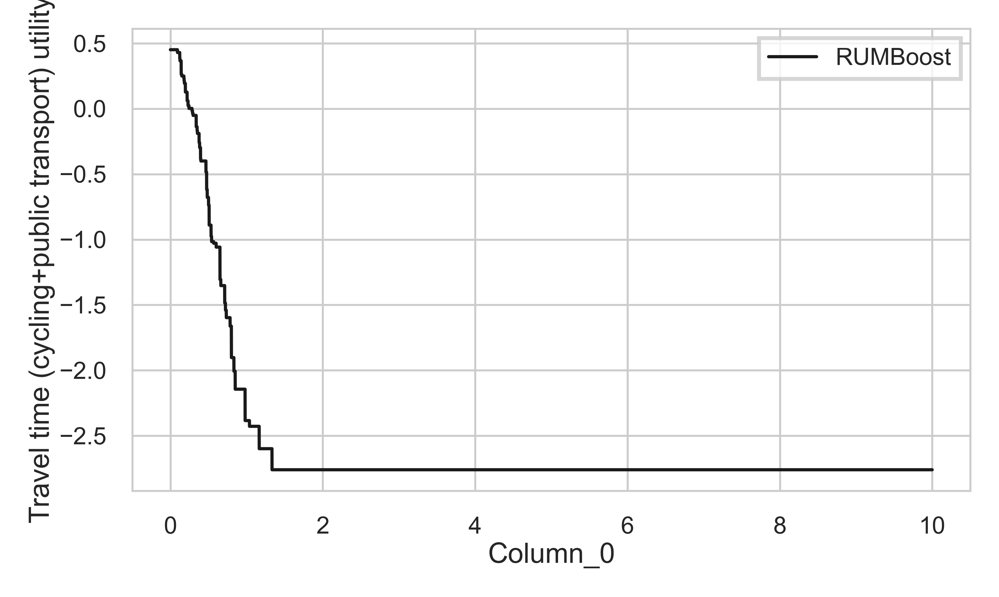

In [2]:
rum_structure = [{'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance'], 
                  'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1], 
                  'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15]], 
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance'], 
                 'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1], 
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15]]
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance', 'dur_pt_access', 'dur_pt_bus', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'pt_n_interchanges', 'cost_transit'], 
                 'monotone_constraints': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1, -1, -1, -1, -1, -1],
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20], [21]],
                },
                {'columns': ['age', 'female', 'day_of_week', 'start_time_linear', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol', 'distance', 'cost_driving_fuel', 'congestion_charge', 'driving_traffic_percent'], 
                 'monotone_constraints': [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1, -1, -1], 
                 'interaction_constraints': [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18]],
                },
                # {'columns': ['dur_walking', 'dur_cycling', 'dur_pt_rail', 'dur_driving'],
                #  'monotone_constraints': [-1],
                # },
                {'columns': ['dur_walking', 'dur_cycling'],
                 'monotone_constraints': [-1]
                },
                {'columns': ['dur_pt_rail', 'dur_driving'],
                 'monotone_constraints': [-1]
                },
                ]

#shared_ensembles = {4: [0, 1, 2, 3]}
shared_ensembles = {4: [0, 1],
                   5: [2, 3]}

#features and label column names
features = [f for f in LPMC_train.columns if f != "choice"]
label = "choice"

#create lightgbm dataset
lgb_train_set = lgb.Dataset(LPMC_train[features], label=LPMC_train[label], free_raw_data=False)
lgb_test_set = lgb.Dataset(LPMC_test[features], label=LPMC_test[label], free_raw_data=False)

LPMC_model_fully_trained = rum_train(params, lgb_train_set, rum_structure, valid_sets=[lgb_test_set], shared_ensembles=shared_ensembles)

utility_names = {'0':'Walking', '1':'Cycling', '2':'Public Transport', '3': 'Driving', '4':'Travel time (walking+driving)', '5':'Travel time (cycling+public transport)'}

plot_parameters(LPMC_model_fully_trained, LPMC_train, utility_names,only_1d=True)

